In [34]:
!pip install netCDF4
!pip install xarray
!pip install xbatcher
!pip install torchmetrics
!pip install python-geohash

In [35]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.utils.data import IterableDataset
import numpy as np
from tqdm import tqdm
from netCDF4 import Dataset as NetCDFFile
import xarray as xr
import matplotlib.pyplot as plt
import xbatcher
import geohash
import os
import pickle

In [36]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [37]:
os.chdir("/content/drive/My Drive")

In [38]:
# just fingerprints (output from David's code)
fingerprint_file = r'projects/EPS 91/SSH_Patterns.nc'

# full ocean dynamics (output from Sonke's code)
ocean_dynamics_file = r'projects/EPS 91/GLORYS_Surrogate_Combined_40320sims.nc'

# synthetics_file = r'projects/EPS 91/synthetics.pkl'

In [39]:
# synthetic fingerprints dataset
immutable_fingerprints = xr.open_dataset(fingerprint_file)
fingerprints = immutable_fingerprints.copy(deep=True)

#### Visualize Synthetic Fingerprints

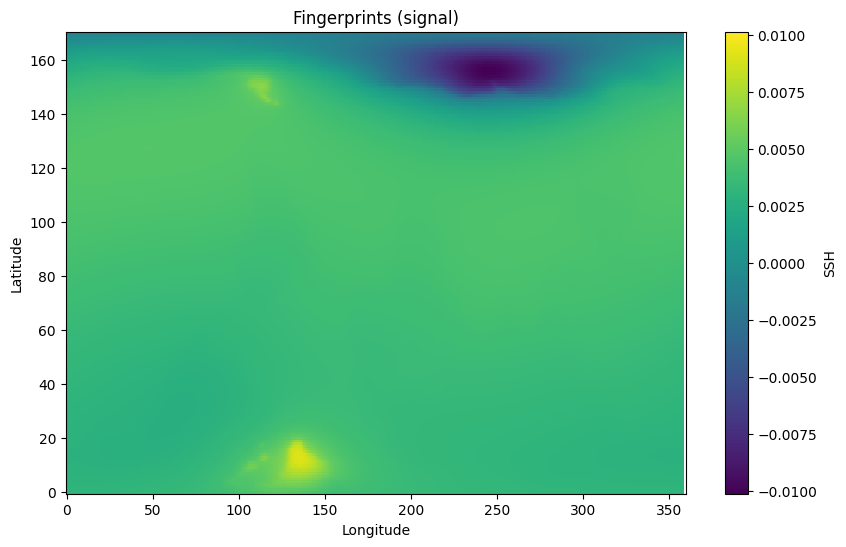

In [40]:
# Select timestep/simualtion number
fingerprint_data_slice = fingerprints['SSH'].isel(time=0, nsim=0)

plt.figure(figsize=(10, 6))
fingerprint_data_slice.plot(cmap='viridis')
plt.title('Fingerprints (signal)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [41]:
# synthetic ocean dynamics dataset
immutable_ocean_dynamics = xr.open_dataset(ocean_dynamics_file)
ocean_dynamics = immutable_ocean_dynamics.copy(deep=True)

#### Visualize Synthetic Ocean Dynamics Field

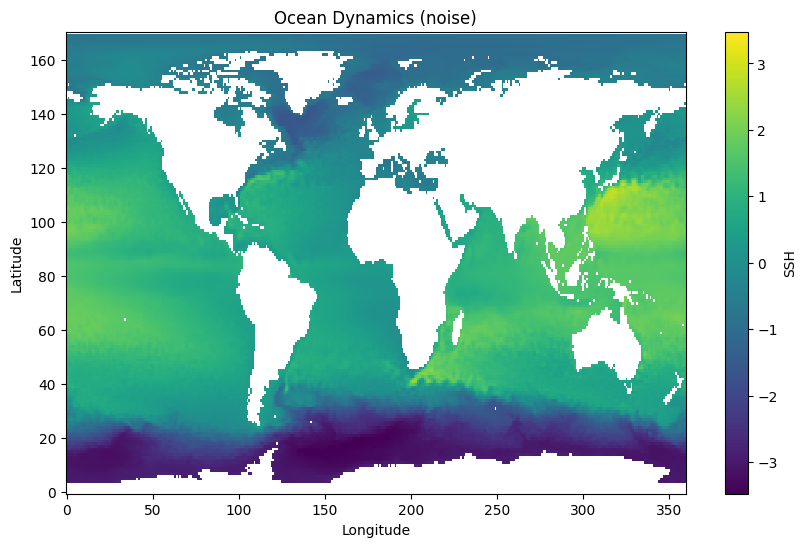

In [42]:
# Select timestep/simualtion number
surrogate_data_slice = ocean_dynamics['SSH'].isel(time=100, nsim=100)

plt.figure(figsize=(10, 6))
surrogate_data_slice.plot(cmap='viridis')
plt.title('Ocean Dynamics (noise)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [43]:
print(ocean_dynamics['time'])
print('-'*80)
print(fingerprints['time'])

<xarray.DataArray 'time' (time: 336)> Size: 1kB
array([1993.    , 1993.0834, 1993.1666, ..., 2020.75  , 2020.8334, 2020.9166],
      dtype=float32)
Coordinates:
  * time     (time) float32 1kB 1.993e+03 1.993e+03 ... 2.021e+03 2.021e+03
--------------------------------------------------------------------------------
<xarray.DataArray 'time' (time: 336)> Size: 1kB
array([9.96921e+36, 9.96921e+36, 9.96921e+36, ..., 9.96921e+36, 9.96921e+36,
       9.96921e+36], dtype=float32)
Coordinates:
  * time     (time) float32 1kB 9.969e+36 9.969e+36 ... 9.969e+36 9.969e+36


In [44]:
# ocean_dynamics, fingerprints = xr.align(ocean_dynamics, fingerprints)
# synthetics = fingerprints.copy()

# synthetics['SSH'] = fingerprints['SSH'] + ocean_dynamics['SSH']

In [45]:
# with open(synthetics_file, 'rb') as file:
#     synthetics = pickle.load(file)

In [46]:
# # Define the dimensions for the dataset
# synthetics_ds = xr.Dataset(
#     {
#         'SSH': (['time', 'lat', 'lon', 'nsim'], synthetics['SSH'].values)
#     }
# )

# # Check the dataset structure
# print(synthetics_ds)

#### Visualize Full Synthetic Field

In [47]:
# combined_ssh_slice = synthetics_ds['SSH'].isel(time=100, nsim=100)
# plt.figure(figsize=(10, 6))
# combined_ssh_slice.plot(cmap='viridis')
# plt.title('Full Synthetic (combined)')
# plt.xlabel('Longitude')
# plt.ylabel('Latitude')
# plt.show()

#### Generate batches of data for training. Input_gen full ocean dynamics combined with fingerprints and target_gen contains only fingerprint (our model's prediction targets)

#### Train/Validation splits and Batch Generators

In [48]:
batch_size = None

def prepare_data(data, mode, sim_ratio=0.1*0.333, offset=64, lat_start=20, lon_start=150):

  global batch_size

  if mode == 'patch':

    data_patch = data.isel(lat=slice(lat_start, lat_start + offset), lon=slice(lon_start, lon_start + offset))

    original_lat = data_patch['lat'].values
    original_lon = data_patch['lon'].values

    data_collapsed = data_patch.stack(sim=('time', 'nsim'))

    # batch_size = int((0.8 * data_collapsed.sizes['sim'])*sim_ratio)

    # According to DCGAN paper this is optimal batch_size
    batch_size = int(128)

    data_train = data_collapsed.isel(sim=slice(0, batch_size))

    data_val = data_collapsed.isel(sim=slice(batch_size, None))

    train_data_gen = xbatcher.BatchGenerator(data_train, {'sim': batch_size, 'lat': offset, 'lon': offset})

    val_data_gen = xbatcher.BatchGenerator(data_val, {'sim': data_val.sizes['sim'], 'lat': offset, 'lon': offset})

  elif mode == 'global':

    # offset = 1

    data_patch = data.isel(lat=slice(0, 171), lon=slice(0, 360))

    data_collapsed = data_patch.stack(sim=('time', 'nsim'))

    # data_collapsed = data_collapsed.isel(sim=slice(0, offset))

    # batch_size = int(0.8 * data_collapsed.sizes['sim'])

    batch_size = int(128)

    data_train = data_collapsed.isel(sim=slice(0, batch_size))

    data_val = data_collapsed.isel(sim=slice(batch_size, None))

    train_data_gen = xbatcher.BatchGenerator(data_train, {'sim': batch_size, 'lat': 171, 'lon': 360})

    val_data_gen = xbatcher.BatchGenerator(data_val, {'sim': data_val.sizes['sim'], 'lat': 171, 'lon': 360})

  else:
    raise ValueError("Invalid mode. Choose 'patch' or 'global.'")

  return train_data_gen, val_data_gen


In [49]:
# combined_train, combined_val = prepare_data(synthetics_ds, 'patch')
noise_train, noise_val = prepare_data(ocean_dynamics, 'patch')
signal_train, signal_val = prepare_data(fingerprints, 'patch')

In [50]:
for batch in noise_train:
  print(batch["time"].values)
  print(batch["lat"].values)
  print(batch["lon"].values)
  break

[1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1993.
 1993.     1993.     1993.     1993.     1993.     1993.     1

In [51]:
del immutable_fingerprints, fingerprints, immutable_ocean_dynamics, ocean_dynamics, noise_val, signal_val

In [52]:
def z_score_normalize(a):

  func = lambda x: (x - np.mean(x)) / np.std(x)
  return xr.apply_ufunc(func, a)

def max_normalize(a):

  def func(x):
    # Get the maximum absolute value
    max_val = np.max(np.abs(x))
    if max_val != 0:
      # Normalize by max absolute value
      return x / max_val
    else:
      # Handle case where max is zero
      return np.zeros_like(x)
  return xr.apply_ufunc(func, a)

def std_normalize(a):

  def func(x):
    # Get standard deviation
    std = np.std(x)  
    if std != 0:
      return x / std  
    # Normalize by standard deviation
    else:
      # Handle case where max is zero
      return np.zeros_like(x)
        

  return xr.apply_ufunc(func, a)

def patch_normalize(a):

  def func(x):
    max_val = np.abs(np.max(np.abs(x), axis=(1, 2), keepdims=True))
    # Normalize while avoiding division by zero
    return np.divide(x, max_val, where=max_val != 0)

  # Apply function to each patch
  return xr.apply_ufunc(func, a, input_core_dims=[['sim', 'lat', 'lon']],
                          output_core_dims=[['sim', 'lat', 'lon']],
                          vectorize=True,
                          dask='allowed')

In [53]:
def max_normalize(a):

    def func(x):
      # Get the maximum absolute value
      max_val = np.max(np.abs(x)).astype(np.float32)
      if max_val != 0:
        # Normalize by max absolute value
        return x / max_val
      else:
        # Handle case where max is zero
          return np.zeros_like(x)

    return xr.apply_ufunc(func, a)

In [54]:
# Function to visualize input, prediction, and target for multiple samples
def visualize_examples(predictions, targets, offset, epoch, num_examples=1):

    for i in range(num_examples):
        prediction_sample = predictions[-i, :, :].cpu().detach().numpy().reshape(offset, offset)  # Reshape to (offset, offset)
        target_sample = targets[-i, :, :].detach().cpu().numpy().reshape(offset, offset) # Reshape to (offset, offset)

        # Plot input, prediction, and target side by side
        fig, axes = plt.subplots(1, 2, figsize=(offset*5, offset))

        # Prediction visualization
        im0 = axes[0].imshow(prediction_sample, cmap='viridis', interpolation='none')
        axes[0].set_title(f"Residuals")
        axes[0].axis('off')
        fig.colorbar(im0, ax=axes[0])  # Add colorbar for prediction


        # Target visualization
        im1 = axes[1].imshow(target_sample, cmap='viridis', interpolation='none')
        axes[1].set_title(f"Target Signal")
        axes[1].axis('off')
        fig.colorbar(im1, ax=axes[1])  # Add colorbar for prediction


        plt.show()

In [143]:
def init_weights(model):
    for layer in model.modules():
        if isinstance(layer, (nn.Conv2d, nn.BatchNorm2d, nn.ConvTranspose2d)):
          # Initialize weights according to DCGAN paper
            nn.init.normal_(layer.weight, mean=0, std=0.02)
            if layer.bias is not None:
                nn.init.zeros_(layer.bias)

class Generator(nn.Module):
    def __init__(self, noise_channels, output_dim=64, patch_channels=1):
        super(Generator, self).__init__()
        self.network = nn.Sequential(
            nn.ConvTranspose2d(noise_channels, output_dim*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(output_dim*8),
            # nn.ReLU(),
            nn.LeakyReLU(0.2),
            self.gen_block(output_dim * 8, output_dim * 4),
            self.gen_block(output_dim * 4, output_dim * 2),
            self.gen_block(output_dim * 2, output_dim),
            nn.ConvTranspose2d(output_dim, patch_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    # Currently testing with LeakyReLU and TanH activation in generator to minimize residual error
    def gen_block(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=bias),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
            # nn.ReLU()
        )

    def forward(self, x):
        return self.network(x)

    # def output_size(self):
    #   return ((input_size-1)*stride-2*padding+kernel_size)/1

class Discriminator(nn.Module):
    def __init__(self, patch_channels=1, output_dim=64):
        super(Discriminator, self).__init__()
        self.network = nn.Sequential(
            nn.Conv2d(patch_channels, output_dim, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2),
            self.disc_block(output_dim, output_dim * 2),
            self.disc_block(output_dim * 2, output_dim * 4),
            self.disc_block(output_dim * 4, output_dim * 8),
            nn.Conv2d(output_dim * 8, patch_channels, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def disc_block(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=bias),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.network(x)


In [145]:
import numpy as np

def nan_filter(input, threshold=0.2, patch_dim=64):
# Input is size 30,000 x 171 x 360. Convert to smaller patch size
  sim_dim = input.sizes['sim']
  lat_dim = input.sizes['lat']
  lon_dim = input.sizes['lon']

  # input_gen = xbatcher.BatchGenerator(input, {'sim': sim_dim, 'lat': patch_dim, 'lon': patch_dim})
  input_gen = xbatcher.BatchGenerator(input, {'lat': patch_dim, 'lon': patch_dim})

  tmp = []
  for batch in input_gen:

    batch = np.transpose(batch['SSH'].values, (2, 0, 1)) # size batch_size x patch_dim, patch_dim
    input_filtered = np.nan_to_num(batch, nan=0)
    zero_count = np.count_nonzero(input_filtered == 0, axis=(1, 2))
    total_pixels = input_filtered.shape[1] * input_filtered.shape[2]
    zero_ratio = zero_count / total_pixels
    mask = zero_ratio <= threshold
    filtered_patches = input_filtered[mask]
    tmp.append(filtered_patches)
  filtered_array = np.concatenate(tmp, axis=0)
  final_array = xr.DataArray(filtered_array, dims=('lat', 'lon', 'sim'), coords={'lat': lat_dim, 'lon': lon_dim, 'sim': sim_dim}).astype(np.float16)

  return final_array


In [157]:
class MyMinMaxScaler():
    def __init__(self, minmax=(-1, 1)):
        self.range_min, self.range_max = minmax

    def fit(self, data):
      # Save parameters for rescaling; input is size batch_size x H x W
      self.init_data = data.astype(np.float64)
      self.data_min = np.min(data, axis=(1, 2), keepdims=True).astype(np.float64)
      self.data_max = np.max(data, axis=(1, 2), keepdims=True).astype(np.float64)

    def transform(self, data):
        self.data_std = ((data - self.data_min) / (self.data_max - self.data_min)).astype(np.float64)
        data_scaled = (self.data_std * (self.range_max - self.range_min) + self.range_min).astype(np.float64)
        return data_scaled

    def fit_transform(self, data):
        self.fit(data)
        return self.transform(data)

    def inverse_transform(self, data):
        rescaled = np.round(((data - self.range_min) / (self.range_max - self.range_min) * (self.data_max - self.data_min) + self.data_min), 3).astype(np.float64)
        # Experiencing floating point precision errors; ensure dtype is consistent throughout all operations
        assert np.array_equal(self.init_data, rescaled)
        return rescaled

class MyGlobalMaxScaler():
    def __init__(self):
      pass

    def fit(self, data):
      # Save parameters for rescaling
      self.init_data = np.round(data, 3).astype(np.float64)
      self.max_val = np.max(np.abs(data)).astype(np.float64)

    def transform(self, data):
        data = np.round(data, 3).astype(np.float64)
        data_scaled = np.round(data / self.max_val, 3).astype(np.float64)
        return data_scaled

    def fit_transform(self, data):
        self.fit(data)
        return self.transform(data)

    def inverse_transform(self, data):
        rescaled_data = np.round(data*self.max_val, 3).astype(np.float64)
        # Experiencing floating point precision errors; ensure dtype is consistent throughout all operations
        assert np.array_equal(self.init_data, rescaled_data)
        return rescaled_data



In [147]:
# Can pass kernel_size/stride as tuples for height/width. Will need to do this for global case
# Also need to completely revamp nan filter for global

In [162]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

noise_channels = 100

generator = Generator(noise_channels).to(device).to(torch.float64)
discriminator = Discriminator().to(device).to(torch.float64)

init_weights(generator)
init_weights(discriminator)

gen_optim = optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
disc_optim = optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))

criterion = nn.BCELoss()

disc_updates = 2

In [164]:
scaler = MyMinMaxScaler()

generator.train()
discriminator.train()

for epoch in range(500):
  for batch in noise_train:
    filtered_batch = nan_filter(batch)
    if filtered_batch.sizes['sim'] == 0:
      continue

    # max_val = np.max(np.abs(filtered_batch.values)).astype(np.float64)
    norm_batch = np.round(scaler.fit_transform(filtered_batch.values), 4)
    # norm_batch = np.round(max_normalize(filtered_batch.values)
    real = torch.tensor(norm_batch, dtype=torch.float64).permute(0, 2, 1).unsqueeze(1).to(device)

    del filtered_batch

    real_target = torch.full((batch_size,), 0.9, dtype=torch.float64, device=device)
    fake_target = torch.full((batch_size,), 0.1, dtype=torch.float64, device=device)

    for _ in range(disc_updates):
      # Train discriminator
      discriminator.zero_grad()
      # Test discriminator on real example
      real_pred = discriminator(real).squeeze()
      loss_disc_real = criterion(real_pred, real_target)
      loss_disc_real.backward()

      # Generate fake example
      latent_noise = torch.round(torch.randn((batch_size, noise_channels, 1, 1)).to(device), decimals=4).to(torch.float64)
      fake = generator(latent_noise).to(torch.float64)
      # Test discriminator on generated fake example
      fake_pred = discriminator(fake.detach()).reshape(-1)
      loss_disc_fake = criterion(fake_pred, fake_target)
      loss_disc_fake.backward()
      disc_optim.step()

    # Train generator
    generator.zero_grad()
    # Maximize likelihood that discriminator things generated example is real
    new_fake_pred = discriminator(fake).reshape(-1)
    loss_gen = criterion(new_fake_pred, real_target)
    loss_gen.backward()
    gen_optim.step()

  if epoch % 25 == 0:
    print(f"Epoch {epoch} Visualizations")
    visualize_examples(fake, real, 64, epoch)
    print("Discriminator loss on real predictions: ", loss_disc_real.item())
    print("Discriminator loss on fake predictions: ", loss_disc_fake.item())
    print("Generator loss: ", loss_gen.item())




Epoch 0 Visualizations


Discriminator loss on real predictions:  0.6105641268153341
Discriminator loss on fake predictions:  0.6796894442827888
Generator loss:  0.7161699575330481
Epoch 25 Visualizations


Discriminator loss on real predictions:  0.32515682110660926
Discriminator loss on fake predictions:  0.32616050485453185
Generator loss:  1.9838762328551145
Epoch 50 Visualizations


Discriminator loss on real predictions:  0.32513306209049075
Discriminator loss on fake predictions:  0.32514535821660406
Generator loss:  2.088239719190009
Epoch 75 Visualizations


Discriminator loss on real predictions:  0.32523210910169087
Discriminator loss on fake predictions:  0.32569498978762057
Generator loss:  2.165595734183799
Epoch 100 Visualizations


Discriminator loss on real predictions:  0.32523180567388005
Discriminator loss on fake predictions:  0.3252757770354367
Generator loss:  2.107612028825047
Epoch 125 Visualizations


Discriminator loss on real predictions:  0.37405408672018836
Discriminator loss on fake predictions:  0.3442425453899376
Generator loss:  1.8580940914067685
Epoch 150 Visualizations


Discriminator loss on real predictions:  0.35542225924273196
Discriminator loss on fake predictions:  0.41824003514175706
Generator loss:  1.681655392593986
Epoch 175 Visualizations


Discriminator loss on real predictions:  0.344643031934048
Discriminator loss on fake predictions:  0.32806350681394436
Generator loss:  1.8624673518039803
Epoch 200 Visualizations


Discriminator loss on real predictions:  0.522172001492157
Discriminator loss on fake predictions:  0.5283729494795211
Generator loss:  0.99820788053822
Epoch 225 Visualizations


Discriminator loss on real predictions:  0.3706272719088347
Discriminator loss on fake predictions:  0.39163201705543893
Generator loss:  1.4693372689888322
Epoch 250 Visualizations


Discriminator loss on real predictions:  0.9308572839196354
Discriminator loss on fake predictions:  0.32775282209285417
Generator loss:  0.8744672551985605
Epoch 275 Visualizations


Discriminator loss on real predictions:  0.5594637528873291
Discriminator loss on fake predictions:  0.4024255130032938
Generator loss:  1.0696397935052233
Epoch 300 Visualizations


Discriminator loss on real predictions:  0.7401675771318399
Discriminator loss on fake predictions:  0.36403039388943814
Generator loss:  1.0744863241559484
Epoch 325 Visualizations


Discriminator loss on real predictions:  0.7082123199750514
Discriminator loss on fake predictions:  0.3836201064967549
Generator loss:  0.8094445893544112
Epoch 350 Visualizations


Discriminator loss on real predictions:  0.5574333481123559
Discriminator loss on fake predictions:  0.44667533592074254
Generator loss:  1.2464325123997075
Epoch 375 Visualizations


Discriminator loss on real predictions:  0.6395327402465347
Discriminator loss on fake predictions:  0.34203470693657745
Generator loss:  1.3969182686321935
Epoch 400 Visualizations


Discriminator loss on real predictions:  0.7565173747286924
Discriminator loss on fake predictions:  0.328675205370357
Generator loss:  0.8263748256752467
Epoch 425 Visualizations


Discriminator loss on real predictions:  0.5258839253316265
Discriminator loss on fake predictions:  0.3893853813896299
Generator loss:  1.4885589854923857
Epoch 450 Visualizations


Discriminator loss on real predictions:  0.5461255223062786
Discriminator loss on fake predictions:  0.3443196375356651
Generator loss:  1.525837167530625
Epoch 475 Visualizations


Discriminator loss on real predictions:  0.4725759741682543
Discriminator loss on fake predictions:  0.33828167995306513
Generator loss:  1.5513087958434804


In [151]:
def print_stats(data, data_per, name):
  data_min = np.min(data)
  data_max = np.max(data)
  data_med = np.median(data)

  d = {
      'name': name,
      'min': round(data_min, 4),
      '10th per': round(data_per[1], 4),
      'mean': round(data_per[2], 4),
      'median': round(data_med, 4),
      '90th per': round(data_per[3], 4),
      'max': round(data_max, 4),
      'std': round(np.std(data), 4)
  }

  return d

In [152]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.ticker as ticker
import pandas as pd
from IPython.display import display

# Function to visualize distributions
def visualize_distributions(input1, input2):

    pers = [5, 10, 50, 90, 95]

    if isinstance((input1, input2), torch.Tensor):
      input1, input2 = input1.cpu().detach().numpy(), input2.cpu().detach().numpy()

    if len(input1) == 0 or len(input2) == 0:
      print("One or both input arrays are empty.")
      return

    residuals_flat, signal_flat = input1, input2

    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    residuals_per = np.percentile(residuals_flat, pers)
    sns.histplot(residuals_flat, ax=axes[0], bins=10000, kde=True)
    [axes[0].axvline(x=x, color='red', linestyle='--') for x in residuals_per[1:-1]]
    lower, upper = residuals_per[0], residuals_per[-1]
    range_ = upper - lower
    axes[0].set_xlim(lower - range_ * 0.1, upper + range_ * 0.1)
    axes[0].set_title('Estimation Error Distribution')
    axes[0].set_xlabel('Value')
    axes[0].set_ylabel('Density')
    noise_stats = print_stats(residuals_flat, residuals_per, 'estimation error')

    signal_per = np.percentile(signal_flat, pers)
    sns.histplot(signal_flat, ax=axes[1], bins=10000, kde=True)
    [axes[1].axvline(x=x, color='red', linestyle='--') for x in signal_per[1:-1]]
    lower, upper = signal_per[0], signal_per[-1]
    range_ = upper - lower
    axes[1].set_xlim(lower - range_ * 0.1, upper + range_ * 0.1)
    axes[1].set_title('Scaled Estimation Error Distribution')
    axes[1].set_xlabel('Value')
    axes[1].set_ylabel('Density')
    signal_stats = print_stats(signal_flat, signal_per, 'scaled estimation error')

    stats_df = pd.DataFrame([noise_stats, signal_stats])
    display(stats_df)

    def format_ticks(value, tick_number):
        return f"{value:.4f}"

    # Apply formatting to all x-axes
    for i in range(2):
        axes[i].xaxis.set_major_formatter(ticker.FuncFormatter(format_ticks))
        plt.setp(axes[i].get_xticklabels(), rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

In [154]:
for noise_batch, signal_batch in zip(noise_train, signal_train):

  filtered_noise, filtered_signal = nan_filter(noise_batch), nan_filter(signal_batch)
  if filtered_noise.sizes['sim'] == 0:
    continue

  # noise_max_val = np.max(np.abs(filtered_noise)).values.astype(np.float32)

  noise = torch.tensor(filtered_noise.values, dtype=torch.float32).permute(0, 2, 1)

  # test_noise = torch.tensor(filtered_noise.values/noise_max_val, dtype=torch.float32).permute(0, 2, 1)

  signal = torch.tensor(filtered_signal.values, dtype=torch.float32).permute(0, 2, 1)
  combined = noise + signal

  tmp_fake = fake.squeeze().detach().numpy().astype(np.float32)
  # print(np.round((tmp_real*max_val), 2)==np.round(noise.detach().numpy(), 2))
  tmp_real = real.squeeze().detach().numpy().astype(np.float32)
  # print(tmp_fake)
  scaled_fake = scaler.inverse_transform(tmp_fake)
  scaled_real = scaler.inverse_transform(tmp_real)

  residuals = tmp_fake - tmp_real
  scaled_residuals = scaled_fake - noise.detach().numpy()
  plot_signal = combined - scaled_real
  predicted_signal = combined - scaled_fake
  # print(plot_signal)

  norm_fake_flat = tmp_fake.flatten()
  norm_noise_flat = tmp_real.flatten()
  residuals_flat = residuals.flatten()
  scaled_residuals_flat = scaled_residuals.flatten()
  predicted_signal_flat = predicted_signal.detach().numpy().flatten()
  signal_flat = signal.detach().numpy().flatten()
  visualize_examples(torch.tensor(plot_signal, dtype=torch.float32), torch.tensor(signal, dtype=torch.float32), 64, 1)
  # visualize_distributions(scaler.inverse_transform(residuals_flat), scaled_residuals_flat)
  break

<ipython-input-154-8a58c9fecbff>:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  visualize_examples(torch.tensor(plot_signal, dtype=torch.float32), torch.tensor(signal, dtype=torch.float32), 64, 1)
